In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from tqdm import tqdm

from ad_config_search.process_pylot_runs import get_accuracies, get_latencies

In [10]:
DATA_PATH = "../scripts/sweep_files/"

In [11]:
unique_runs = list(set([path.stem.split(".")[0] for path in Path(DATA_PATH).iterdir()]))
# unique_runs.remove("efficientdet-d3-town01_start99-TestDataSet-270-480")
# unique_runs.remove("efficientdet-d6-town03_start20-TrainingDataSet-1080-1920")
unique_runs[:20]

['efficientdet-d5-town03_start20-TrainingDataSet-1080-1920',
 'efficientdet-d5-town01_start1-TrainingDataSet-1080-1920',
 'faster-rcnn-town03_start10-TrainingDataSet-1080-1920',
 'efficientdet-d5-town03_start100-TrainingDataSet-1080-1920',
 'efficientdet-d5-town01_start30-TrainingDataSet-1080-1920',
 'efficientdet-d5-town01_start40-TrainingDataSet-1080-1920',
 'efficientdet-d5-town01_start80-TestDataSet-1080-1920',
 'faster-rcnn-town02_start80-TestDataSet-1080-1920',
 'efficientdet-d5-town01_start99-TestDataSet-1080-1920',
 'faster-rcnn-town02_start99-TestDataSet-1080-1920',
 'faster-rcnn-town01_start20-TrainingDataSet-1080-1920',
 'faster-rcnn-town02_start20-TrainingDataSet-1080-1920',
 'efficientdet-d5-town03_start10-TrainingDataSet-1080-1920',
 'faster-rcnn-town03_start150-TrainingDataSet-1080-1920',
 'efficientdet-d5-town03_start1-TrainingDataSet-1080-1920',
 'faster-rcnn-town03_start1-TrainingDataSet-1080-1920',
 'efficientdet-d5-town03_start200-TrainingDataSet-1080-1920',
 'faste

In [12]:
df = pd.DataFrame(columns=["model_name", "run_name", "latencies", "accuracies"])

In [6]:
for run in tqdm(unique_runs):
    splitted_run = run.split("-")
    if splitted_run[0] == "faster":
        model_name = "frcnn"
        run_name = "-".join(splitted_run[2:])
    elif splitted_run[0] == "efficientdet":
        model_name = "edet-{}".format(splitted_run[1])
        run_name = "-".join(splitted_run[2:])
        if model_name == "edet-d6":
            continue
    elif splitted_run[0] == "ssdlite":
        model_name = "ssd-v2"
        run_name = "-".join(splitted_run[3:])
    df = df.append({"model_name": model_name, "run_name": run_name, "latencies": get_latencies(DATA_PATH, run), "accuracies": get_accuracies(DATA_PATH, run)}, ignore_index=True)

  0%|          | 0/48 [00:00<?, ?it/s]


AssertionError: Can't find mAP in ../scripts/sweep_files/efficientdet-d5-town03_start20-TrainingDataSet-1080-1920.csv

In [10]:
df.columns

Index(['model_name', 'run_name', 'latencies', 'accuracies'], dtype='object')

In [11]:
df["mean_lat"] = df["latencies"].apply(lambda x: np.mean(x)/1000.)
df["mean_mAP_acc"] = df["accuracies"].apply(lambda x: np.mean(x))
df["town"] = df["run_name"].apply(lambda s: s.split("_")[0])
df["train"] = df["run_name"].apply(lambda s: "train" if "Training" in s else "test")
df["town-train"] = df["town"]+"-"+df["train"]
df["resolution"] = df["run_name"].apply(lambda s: "({}, {})".format(*s.split("-")[-2:]))

In [12]:
df["mAP_data_length"] = df["accuracies"].apply(lambda a: len(a))
df["lat_data_length"] = df["latencies"].apply(lambda a: len(a))

In [13]:
df = df.sort_values("run_name")

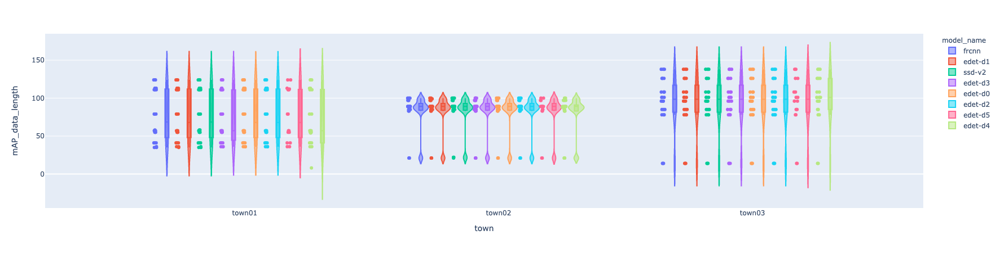

In [14]:
import plotly.express as px
fig = px.violin(df, y="mAP_data_length", x="town", color="model_name", box=True, points="all", hover_data=["model_name", "run_name", "mean_lat", "mean_mAP_acc"])
fig.show()

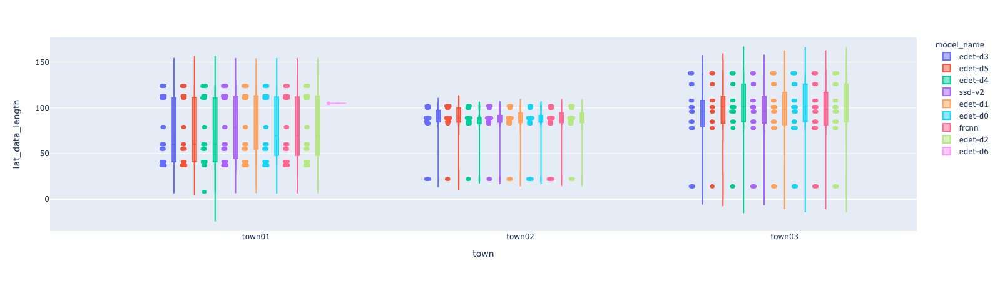

In [63]:
import plotly.express as px
fig = px.violin(df, y="lat_data_length", x="town", color="model_name", box=True, points="all", hover_data=["model_name", "run_name", "mean_lat", "mean_mAP_acc"])
fig.show()

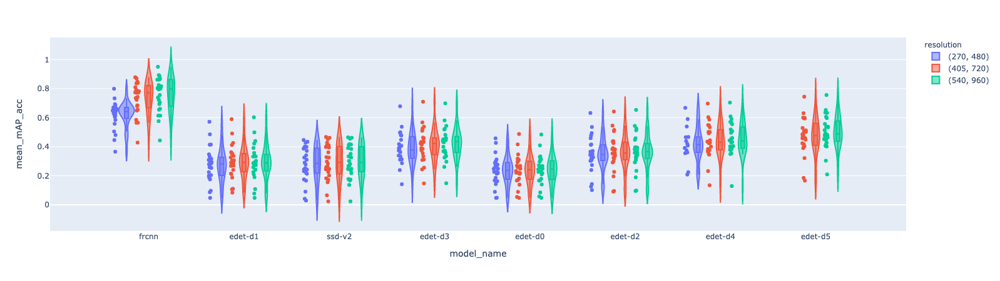

In [15]:
import plotly.express as px
fig = px.violin(df, y="mean_mAP_acc", x="model_name", color="resolution", box=True, points="all", hover_data=["model_name", "run_name", "mean_lat", "mean_mAP_acc"])
fig.show()

In [16]:
df.columns

Index(['model_name', 'run_name', 'latencies', 'accuracies', 'mean_lat',
       'mean_mAP_acc', 'town', 'train', 'town-train', 'resolution',
       'mAP_data_length', 'lat_data_length'],
      dtype='object')

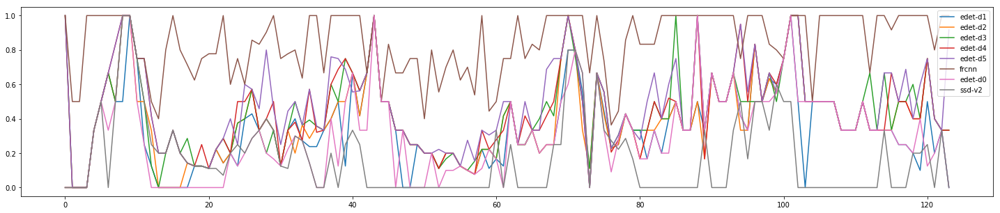

In [38]:
plt.figure(figsize=(25,5))
slc = df.loc[(df["run_name"] == df["run_name"][0])]
model_name
for arr, model_name in zip(slc["accuracies"], slc["model_name"]):
    plt.plot(arr, label=model_name)
plt.legend()

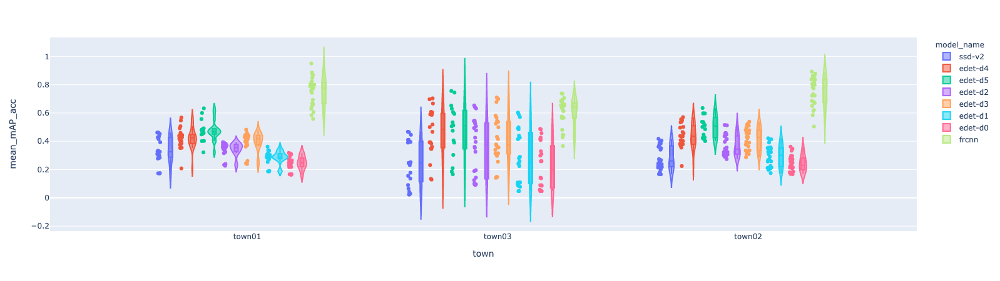

In [21]:
import plotly.express as px
fig = px.violin(df, y="mean_mAP_acc", x="town", color="model_name", box=True, points="all", hover_data=["model_name", "run_name", "mean_lat", "mean_mAP_acc"])
fig.show()

### Observations/conclusions:
  1. Spread in town 3 >> towns 1,2
  2. frcnn much better than the rest, need to train efficient-det on CARLA

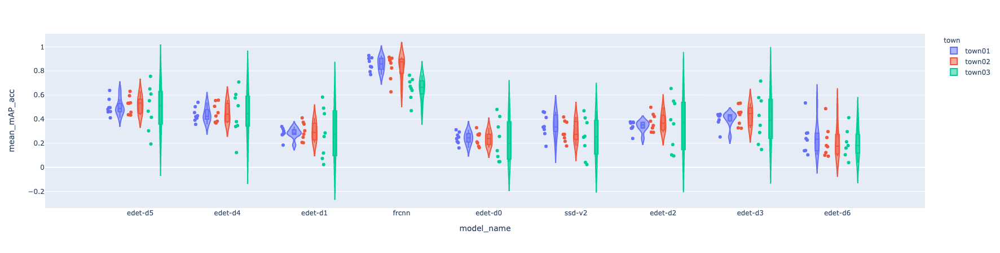

In [56]:
import plotly.express as px
fig = px.violin(df, y="mean_mAP_acc", x="model_name", color="town", box=True, points="all", hover_data=["model_name", "run_name", "mean_lat", "mean_mAP_acc"])
fig.show()

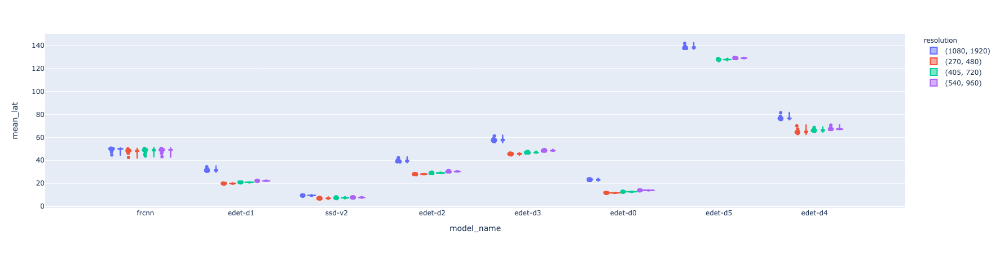

In [37]:
import plotly.express as px
fig = px.violin(df, y="mean_lat", x="model_name", color="resolution", box=True, points="all", hover_data=["model_name", "run_name", "mean_lat", "mean_mAP_acc"])
fig.show()

In [14]:
df["mean_mAP_err"] = 1-df["mean_mAP_acc"]

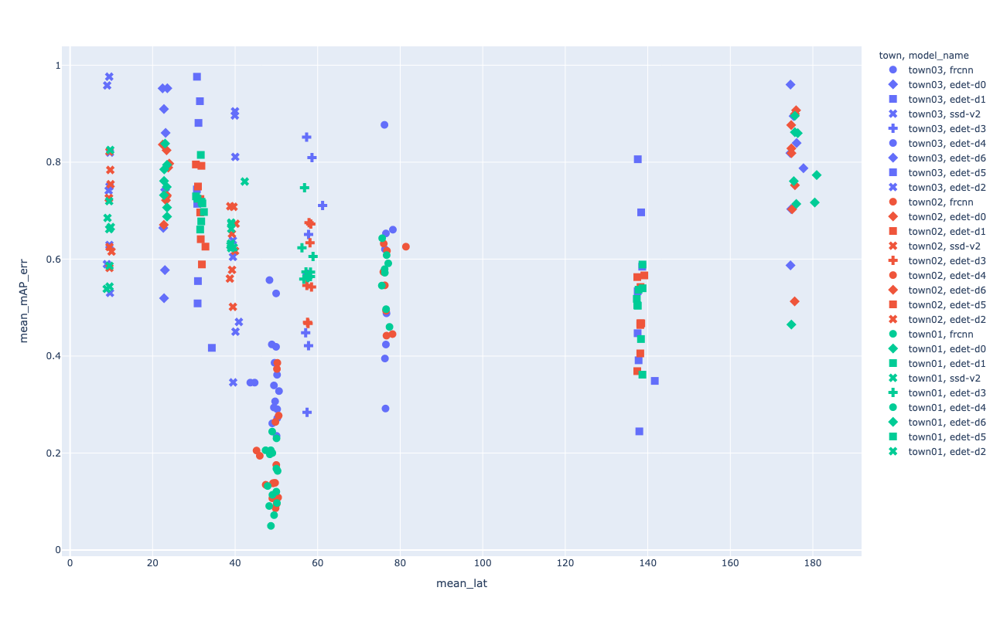

In [15]:
import plotly.express as px
fig = px.scatter(df, y="mean_mAP_err", x="mean_lat", color="town", symbol="model_name", hover_data=["model_name", "run_name", "mean_lat", "mean_mAP_acc"])
fig.update_traces({"marker_size": 10})
fig.update_layout({
    "width":1200,
    "height":800,
})
fig.show()

In [132]:
df = pd.DataFrame(columns=["x", "y", "name"])
for run in unique_runs:
    x, y = np.percentile(get_accuracies(run), 50), np.percentile(get_latencies(run), 50) / 1000.  # us -> ms
    if run.split("-")[0] == "faster":
        name = "frcnn"
    elif run.split("-")[0] == "efficientdet":
        name = "edet-{}".format(run.split("-")[1])
    elif run.split("-")[0] == "ssdlite":
        name = "ssd-v2"
    df = df.append({"x":x,"y":y,"name":name}, ignore_index=True)

In [133]:
df

,x,y,name
0,0.37500,55.7990,edet-d3
1,1.00000,50.5405,frcnn
2,0.33330,39.0290,edet-d2
3,0.33330,9.5780,ssd-v2
4,0.11110,195.1810,edet-d6
5,0.55000,152.2735,edet-d5
6,0.29165,30.7405,edet-d1
7,0.25000,22.3800,edet-d0
8,0.25000,31.3980,edet-d1
9,0.40000,82.5575,edet-d4


In [136]:
import plotly_express as px

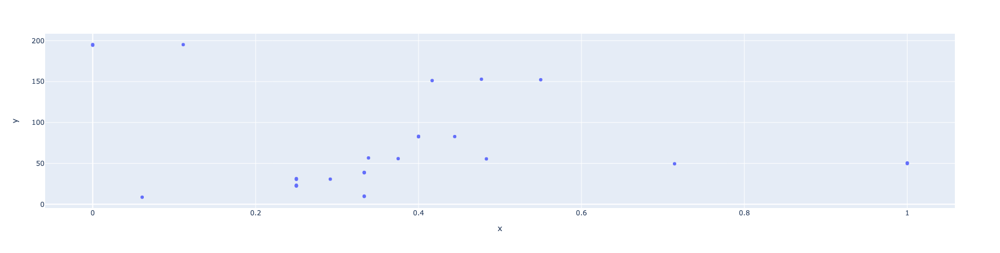

In [138]:
px.scatter(df, x="x", y="y")

In [5]:
df = pd.read_csv("pylot/pylot.csv")
df

,log_ts,simulator_ts,operator,extra_info,value
0,1596739896634,2,detection_eval_operator,runtime,0.2010
1,1596739896634,2,detection_eval_operator,mAP,1.0000
2,1596739896634,2,detection_eval_operator,runtime,0.4060
3,1596739896634,2,detection_eval_operator,mAP,0.5000
4,1596739896634,2,detection_eval_operator,runtime,0.5338
...,...,...,...,...,...
243,1596739915916,121,detection_eval_operator,mAP,1.0000
244,1596739916080,122,detection_eval_operator,runtime,0.1395
245,1596739916080,122,detection_eval_operator,mAP,1.0000
246,1596739916241,123,detection_eval_operator,runtime,0.1407


In [6]:
eval_df = df[df["operator"] == "detection_eval_operator"]
eval_df

,log_ts,simulator_ts,operator,extra_info,value
0,1596739896634,2,detection_eval_operator,runtime,0.2010
1,1596739896634,2,detection_eval_operator,mAP,1.0000
2,1596739896634,2,detection_eval_operator,runtime,0.4060
3,1596739896634,2,detection_eval_operator,mAP,0.5000
4,1596739896634,2,detection_eval_operator,runtime,0.5338
...,...,...,...,...,...
243,1596739915916,121,detection_eval_operator,mAP,1.0000
244,1596739916080,122,detection_eval_operator,runtime,0.1395
245,1596739916080,122,detection_eval_operator,mAP,1.0000
246,1596739916241,123,detection_eval_operator,runtime,0.1407


In [7]:
eval_df["extra_info"].unique()

array(['runtime', 'mAP'], dtype=object)

In [8]:
eval_dict = {}
for k in eval_df["extra_info"].unique():
    ts = eval_df[eval_df["extra_info"] == k]["log_ts"].values.astype(float)/1000.
    value = eval_df[eval_df["extra_info"] == k]["value"].values.astype(float)
    eval_dict[str(k)] = (ts - ts[0], value)
eval_dict.keys()

dict_keys(['runtime', 'mAP'])

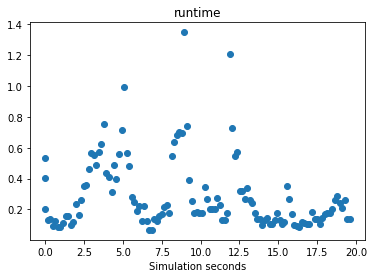

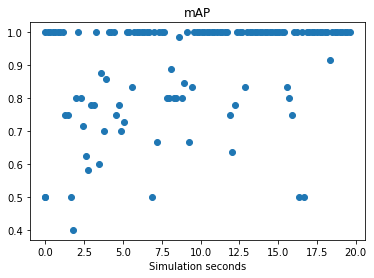

In [9]:
for k, v in eval_dict.items():
    plt.title(k)
    plt.xlabel("Simulation seconds")
    plt.scatter(*v)
    plt.show()

In [11]:
fix_pylot_profile("pylot/pylot_profile.json")

In [12]:
df2 = pd.read_json("pylot/pylot_profile.json")

In [13]:
df2

,name,pid,tid,ts,dur,ph,args
0,offline-carla-camera_operator.get_messages,offline-carla-camera_operator,1,1596739896196164,60575,X,{'timestamp': 'None'}
1,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739896279715,42418,X,{'timestamp': '[0]'}
2,offline-carla-camera_operator.get_messages,offline-carla-camera_operator,1,1596739896366483,49562,X,{'timestamp': 'None'}
3,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739896428223,42486,X,{'timestamp': '[1]'}
4,offline-carla-camera_operator.get_messages,offline-carla-camera_operator,1,1596739896522932,52508,X,{'timestamp': 'None'}
...,...,...,...,...,...,...,...
243,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739915863353,51872,X,{'timestamp': '[121]'}
244,offline-carla-camera_operator.get_messages,offline-carla-camera_operator,1,1596739915957812,58799,X,{'timestamp': 'None'}
245,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739916028194,51577,X,{'timestamp': '[122]'}
246,offline-carla-camera_operator.get_messages,offline-carla-camera_operator,1,1596739916122357,57084,X,{'timestamp': 'None'}


In [14]:
tracker_filtered = df2[df2["name"] == "faster-rcnn.on_msg_camera_stream"]
tracker_filtered

,name,pid,tid,ts,dur,ph,args
1,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739896279715,42418,X,{'timestamp': '[0]'}
3,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739896428223,42486,X,{'timestamp': '[1]'}
5,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739896591381,42261,X,{'timestamp': '[2]'}
7,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739896753085,41804,X,{'timestamp': '[3]'}
9,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739896912348,42020,X,{'timestamp': '[4]'}
...,...,...,...,...,...,...,...
239,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739915538002,53137,X,{'timestamp': '[119]'}
241,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739915701344,51697,X,{'timestamp': '[120]'}
243,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739915863353,51872,X,{'timestamp': '[121]'}
245,faster-rcnn.on_msg_camera_stream,faster-rcnn,1,1596739916028194,51577,X,{'timestamp': '[122]'}


In [15]:
ts = np.array([int(d["timestamp"][1:-1]) for d in tracker_filtered["args"]])
durations = tracker_filtered["dur"].values

In [16]:
ts, durations

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123]),
 array([42418, 42486, 42261, 41804, 42020, 41872, 41648, 42307, 41618,
        41622, 41402, 47716, 48929, 50795, 51391, 50424, 50587, 50966,
        50363, 50643, 50681, 50871, 50938, 50993, 50604, 50918, 51380,
        50456, 50499, 50629, 50721, 51017, 50365, 50218, 51894, 52099,
        51581,

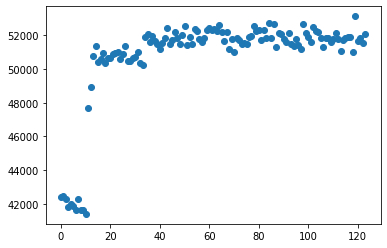

In [18]:
plt.scatter(ts, durations)

In [61]:
obstacles = df[df["operator"] == "obstacle"]
obstacles

,log_ts,simulator_ts,operator,extra_info,value


In [127]:
len(obstacles["simulator_ts"]), len(obstacles["simulator_ts"].unique())

(3856, 1408)

In [107]:
num_people_per_ts = obstacles.groupby("simulator_ts")["extra_info"].count().values

In [132]:
obstacles["simulator_ts"].unique()

array([  3224,   3274,   3324, ..., 105174, 105224, 105274])

In [133]:
num_people_per_ts, len(num_people_per_ts)

(array([2, 2, 2, ..., 3, 3, 4]), 1408)

In [136]:
durations_zipped = zip(ts, durations)

In [135]:
person_count_zipped = zip(obstacles["simulator_ts"].unique(), num_people_per_ts)

In [138]:
person_count_zipped = {k:v for k,v in person_count_zipped}

In [140]:
results = []
for ts, duration in durations_zipped:
    results.append((ts, duration, person_count_zipped.get(ts, 0)))

In [142]:
r = np.array(results)

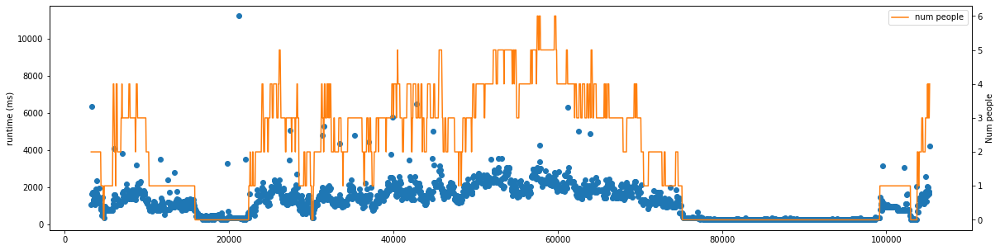

In [169]:
plt.figure(figsize=(20,5))
plt.ylabel("runtime (ms)")
# plt.ylim([200,3000])
plt.scatter(r[:, 0], r[:, 1], label="runtime (ms)")
plt.twinx()
plt.ylabel("Num people")
plt.plot(r[:, 0], r[:, 2], color="tab:orange", label="num people")
plt.legend()

In [64]:
import pandas as pd

In [86]:
%%timeit
csv_path = Path("/home/eyal/AD-config-search/scripts/other_sweep_files/sweep_files/efficientdet-d2-town01_start20-TrainingDataSet-1080-1920.csv")
from ad_config_search.process_pylot_runs import prepend_line_to_file
prepend_line_to_file(csv_path, "log_ts,simulator_ts,operator,extra_info,value")
df = pd.read_csv(csv_path)
len(df.loc[(df["operator"] == "detection_eval_operator") & (df["extra_info"] == "mAP")])

2.09 ms ± 13.4 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
